In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#  accuracy
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# Model
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
from sklearn.model_selection import GridSearchCV

# result
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
pd.set_option('display.max_columns', None)


In [3]:
# Big data
big_data_path = "big/big.csv"
big_data = pd.read_csv(big_data_path, encoding='latin-1')
big_X = big_data.drop('Status', axis = 1).drop('Startup_name', axis = 1)
big_Y = big_data['Status']


# string to int
for i in range(len(big_X['Funding_total_usd'])):
    big_X['Funding_total_usd'][i] = int(big_X['Funding_total_usd'][i].replace(',', ''))


newTmp = []
# handle all string element
for i in range(len(big_X.columns)):
    if(isinstance(big_X.iloc[0, i], str)):
        tmp = pd.get_dummies(big_X[big_X.columns[i]])
        newTmp.append(tmp)

#collect all columns that contain string and drop them
toDelete = []
for i in range(len(big_X.columns)):
    if(isinstance(big_X.iloc[0, i], str)):
        toDelete.append(big_X.columns[i])
big_X =  big_X.drop(toDelete, axis = 1)

#combine dummies and the dataframe after dropping above columns
for i in newTmp:
    big_X = pd.concat([big_X, i], axis = 1)

#sort all features by name(or else learing will fail)
big_X = big_X.sort_index(axis = 1).fillna(0)

# Synthesized Minority Oversampling Technique (SMOTE)
from imblearn.over_sampling import SMOTE

smo = SMOTE(random_state = 2023)
X_smo, y_smo = smo.fit_resample(big_X, big_Y)


pd.DataFrame(X_smo)



/var/folders/j1/784j934j1sv08vg67yg2zkm00000gn/T/ipykernel_7131/3241742766.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  big_X['Funding_total_usd'][i] = int(big_X['Funding_total_usd'][i].replace(',', ''))
/var/folders/j1/784j934j1sv08vg67yg2zkm00000gn/T/ipykernel_7131/3241742766.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  big_X['Funding_total_usd'][i] = int(big_X['Funding_total_usd'][i].replace(',', ''))
/var/folders/j1/784j934j1sv08vg67yg2zkm00000gn/T/ipykernel_7131/3241742766.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docum

1917-Q1  1917/1/1  1919-Q2  1919/6/12  1947-Q1  1947/1/1  1948-Q1  \
0       False     False    False      False    False     False    False   
1       False     False    False      False    False     False    False   
2       False     False    False      False    False     False    False   
3       False     False    False      False    False     False    False   
4       False     False    False      False    False     False    False   
...       ...       ...      ...        ...      ...       ...      ...   
8591    False     False    False      False    False     False    False   
8592    False     False    False      False    False     False    False   
8593    False     False    False      False    False     False    False   
8594    False     False    False      False    False     False    False   
8595    False     False    False      False    False     False    False   

      1948/1/1  1961-Q1  1961/1/1  1969-Q1  1969/1/1  1971-Q1  1971/1/1  \
0        False    False     False    False     False    False     False   
1        False    False     False    False     False    False     False   
2        False    False     False    False     False    False     False   
3        False    False     False    False     False    False     False   
4        False    False     False    False     False    False     False   
...        ...      ...       ...      ...       ...      ...       ...   
8591     False    False     False    False     False    False     False   
8592     False    False     False    False     False    False     False   
8593     False    False     False    False     False    False     False   
8594     False    False     False    False     False    False     False   
8595     False    False     False    False     False    False     False   

      1972-Q1  1972/1/1  1976-Q1  1976/1/1  1977-Q1  1977/1/1  1978-Q1  \
0       False     False    False     False    False     False    False   
1       False     False    False     False    False     False    False   
2       False     False    False     False    False     False    False   
3       False     False    False     False    False     False    False   
4       False     False    False     False    False     False    False   
...       ...       ...      ...       ...      ...       ...      ...   
8591    False     False    False     False    False     False    False   
8592    False     False    False     False    False     False    False   
8593    False     False    False     False    False     False    False   
8594    False     False    False     False    False     False    False   
8595    False     False    False     False    False     False    False   

      1978/1/1  1980-Q1  1980/1/1  1981-Q1  1981/1/1  1982-Q1  1982/1/1  \
0        False    False     False    False     False    False     False   
1        False    False     False    False     False    False     False   
2        False    False     False    False     False    False     False   
3        False    False     False    False     False    False     False   
4        False    False     False    False     False    False     False   
...        ...      ...       ...      ...       ...      ...       ...   
8591     False    False     False    False     False    False     False   
8592     False    False     False    False     False    False     False   
8593     False    False     False    False     False    False     False   
8594     False    False     False    False     False    False     False   
8595     False    False     False    False     False    False     False   

      1983-Q1  1983-Q4  1983/1/1  1983/1/28  1983/10/7  1984-Q1  1984/1/1  \
0       False    False     False      False      False    False     False   
1       False    False     False      False      False    False     False   
2       False    False     False      False      False    False     False   
3       False    False     False      False      False    False     False   
4       False    False     Fa

In [4]:
# Predict
# Small data

small_data_path = 'small/small.csv'
small_data = pd.read_csv(small_data_path)
small_X = small_data.drop('Status', axis = 1).drop('Startup_name', axis = 1).drop('Unnamed: 0', axis = 1)
small_Y = small_data['Status']

#concate those dummies made in bigdata section to smalldata and set all values to 0
#and truncate to original numner of examples in smalldata
for i in newTmp:
    i = i * 0
    small_X = pd.concat([small_X, i], axis = 1)
small_X = small_X.truncate(after=422)

#according to strings in smalldata to set corresponding dummies to 1
small_row, small_col = small_X.shape
for j in range(small_col):
    if(isinstance(small_X.iloc[0, j], str)):
        # print(small_X.iloc[0, j])
        for i in range(small_row):
            somestring = small_X.iloc[i, j]
            if somestring in small_X.columns:
                small_X.at[i, somestring] = 1
            
            
#collect those columns containing strings and drop them
toDelete = []
for i in range(len(small_X.columns)):
    if(isinstance(small_X.iloc[0, i], str)):
        toDelete.append(small_X.columns[i])
small_X =  small_X.drop(toDelete, axis = 1).sort_index(axis = 1).fillna(0)

# for i in newTmp:
#     small_X = pd.concat([small_X, i], axis = 1)

pd.DataFrame(small_X)
# pd.DataFrame(small_Y)


,1917-Q1,1917/1/1,1919-Q2,1919/6/12,1947-Q1,1947/1/1,1948-Q1,1948/1/1,1961-Q1,1961/1/1,1969-Q1,1969/1/1,1971-Q1,1971/1/1,1972-Q1,1972/1/1,1976-Q1,1976/1/1,1977-Q1,1977/1/1,1978-Q1,1978/1/1,1980-Q1,1980/1/1,1981-Q1,1981/1/1,1982-Q1,1982/1/1,1983-Q1,1983-Q4,1983/1/1,1983/1/28,1983/10/7,1984-Q1,1984/1/1,1985-Q1,1985/1/1,1986-Q1,1986/1/1,1987-Q1,1987/1/1,1988-Q1,1988/1/1,1989-Q1,1989/1/1,1990-Q1,1990-Q2,1990-Q3,1990-Q4,1990/1/1,1990/11/1,1990/4/10,1990/8/28,1991-Q1,1991/1/1,1992-Q1,1992/1/1,1992/1/2,1993-Q1,1993-Q4,1993/1/1,1993/10/1,1994-Q1,1994-Q3,1994/1/1,1994/8/1,1995-Q1,1995/1/1,1995/3/1,1996-Q1,1996/1/1,1996/2/6,1997-Q1,1997-Q2,1997-Q3,1997/1/1,1997/4/10,1997/5/5,1997/9/22,1998-Q1,1998-Q2,1998-Q3,1998/1/1,1998/2/1,1998/5/1,1998/6/18,1998/8/1,1998/8/10,1998/9/7,1999-Q1,1999-Q2,1999-Q3,1999-Q4,1999/1/1,1999/10/1,1999/12/1,1999/12/6,1999/5/1,1999/7/14,1999/8/5,1999/9/1,1999/9/12,2000-Q1,2000-Q2,2000-Q3,2000-Q4,2000/1/1,2000/1/20,2000/10/1,2000/11/1,2000/12/1,2000/2/1,2000/3/1,2000/6/1,2000/7/1,2000/8/1,2000/9/1,2001-Q1,2001-Q2,2001-Q3,2001-Q4,2001/1/1,2001/1/19,2001/10/1,2001/3/1,2001/3/27,2001/3/30,2001/6/1,2001/7/1,2001/7/18,2001/8/1,2001/8/6,2002-Q1,2002-Q2,2002-Q3,2002-Q4,2002/1/1,2002/1/15,2002/1/7,2002/10/1,2002/11/1,2002/11/17,2002/12/1,2002/3/1,2002/4/1,2002/6/1,2002/6/28,2002/7/1,2002/9/1,2002/9/30,2003-Q1,2003-Q2,2003-Q3,2003-Q4,2003/1/1,2003/1/3,2003/10/1,2003/11/1,2003/12/1,2003/2/1,2003/3/18,2003/4/1,2003/4/14,2003/5/1,2003/5/5,2003/7/1,2003/7/23,2003/7/25,2003/8/1,2003/8/29,2003/9/1,2004-Q1,2004-Q2,2004-Q3,2004-Q4,2004/1/1,2004/1/12,2004/10/1,2004/10/11,2004/10/15,2004/11/1,2004/12/1,2004/12/31,2004/2/1,2004/2/29,2004/3/1,2004/4/1,2004/4/10,2004/5/1,2004/5/11,2004/6/1,2004/6/12,2004/6/13,2004/7/1,2004/7/10,2004/8/1,2004/9/1,2004/9/30,2005-Q1,2005-Q2,2005-Q3,2005-Q4,2005/1/1,2005/1/15,2005/1/5,2005/1/6,2005/10/1,2005/10/14,2005/10/17,2005/11/1,2005/11/28,2005/11/30,2005/12/1,2005/2/1,2005/2/14,2005/2/15,2005/2/23,2005/3/1,2005/3/14,2005/3/31,2005/4/1,2005/4/22,2005/4/7,2005/4/8,2005/5/1,2005/5/10,2005/6/1,2005/7/1,2005/7/10,2005/7/19,2005/8/1,2005/8/15,2005/8/18,2005/8/28,2005/8/5,2005/9/1,2006-Q1,2006-Q2,2006-Q3,2006-Q4,2006/1/1,2006/1/20,2006/10/1,2006/10/15,2006/11/1,2006/12/1,2006/12/15,2006/2/1,2006/2/3,2006/2/8,2006/2/9,2006/3/1,2006/3/21,2006/4/1,2006/4/30,2006/4/4,2006/5/1,2006/5/3,2006/6/1,2006/6/6,2006/6/9,2006/7/1,2006/7/11,2006/8/1,2006/8/11,2006/8/2,2006/8/29,2006/8/30,2006/8/5,2006/9/1,2006/9/26,2006/9/29,2006/9/6,2006/9/9,2007-Q1,2007-Q2,2007-Q3,2007-Q4,2007/1/1,2007/1/24,2007/1/3,2007/1/4,2007/1/7,2007/10/1,2007/10/14,2007/11/1,2007/11/14,2007/11/7,2007/11/8,2007/12/1,2007/12/11,2007/12/13,2007/12/8,2007/2/1,2007/2/11,2007/2/26,2007/3/1,2007/3/12,2007/3/16,2007/3/7,2007/3/9,2007/4/1,2007/4/16,2007/4/27,2007/4/28,2007/4/3,2007/4/5,2007/4/9,2007/5/1,2007/5/16,2007/6/1,2007/6/4,2007/7/1,2007/7/5,2007/7/7,2007/8/1,2007/8/23,2007/8/27,2007/8/28,2007/8/29,2007/8/6,2007/8/9,2007/9/1,2007/9/10,2007/9/18,2007/9/27,2008-Q1,2008-Q2,2008-Q3,2008-Q4,2008/1/1,2008/1/14,2008/1/15,2008/10/1,2008/10/13,2008/10/17,2008/10/23,2008/10/29,2008/10/3,2008/10/31,2008/11/1,2008/11/17,2008/11/20,2008/11/24,2008/11/3,2008/11/8,2008/12/1,2008/12/5,2008/12/9,2008/2/1,2008/2/22,2008/3/1,2008/3/12,2008/3/19,2008/3/31,2008/4/1,2008/4/10,2008/4/11,2008/4/23,2008/4/7,2008/5/1,2008/5/15,2008/5/2,2008/5/20,2008/5/22,2008/5/5,2008/6/1,2008/6/20,2008/6/26,2008/6/5,2008/7/1,2008/7/10,2008/7/18,2008/7/31,2008/7/7,2008/7/8,2008/8/1,2008/8/10,2008/8/15,2008/8/25,2008/8/27,2008/8/8,2008/9/1,2008/9/10,2008/9/12,2008/9/15,2009-Q1,2009-Q2,2009-Q3,2009-Q4,2009/1/1,2009/1/10,2009/1/2,2009/1/31,2009/10/1,2009/10/10,2009/10/14,2009/10/15,2009/10/26,2009/10/9,2009/11/1,2009/11/11,2009/11/12,2009/11/16,2009/11/17,2009/11/20,2009/11/25,2009/11/8,2009/11/9,2009/12/1,2009/12/7,2009/2/1,2009/2/6,2009/2/9,2009/3/1,2009/3/12,2009/3/14,2009/3/18,2009/3/31,2009/4/1,2009/4/16,2009/4/23,2009/4/30,2009/4/4,2009/4/7,2009/4/9,2009/5/1,2009/6/1,2009/6/11,2009/6/15

In [5]:
# feature importance
    
from sklearn.inspection import permutation_importance
def plot_feature_importances_permutation(model, X, y):
    n_features = X.shape[1]
    results = permutation_importance(model, X, y, scoring='accuracy')
    importances = results.importances_mean
    indices = np.argsort(importances)
    plt.figure(figsize=(12, 200))
    plt.barh(np.arange(n_features), importances[indices], align='center')
    feature_names = np.array(X.columns)
    plt.yticks(np.arange(n_features), feature_names[indices])
    # plt.xlim(feature_names[0], feature_names[-1])
    

    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)
    plt.show()

In [6]:
class Model():
    def __init__(self, model, ratio):
        self.model = model
        self.ratio = ratio # for split
        self.seed = 2023
        self.train_scores_acc = 0
        self.test_scores_acc = 0
        self.train_scores_recall = 0
        self.test_scores_recall = 0
        self.train_scores_f1 = 0
        self.test_scores_f1 = 0
        self.y_pred_acc = 0
        
        # predict variable
        
        
    def show_result(self):
        # Model
        if(self.model == "Decision Tree"):
            clf = tree.DecisionTreeClassifier()
            parameters = {
                'criterion': ['gini', 'entropy'],
                'max_depth': [None, 5, 10, 15],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 3]
            }
            
        elif(self.model == "Logistic Regression"):
            clf = LogisticRegression()
            parameters = {
                'penalty': ['l1', 'l2'],
                'C': [0.01, 0.1, 1.0, 10.0],
                'solver': ['liblinear', 'lbfgs'],
                'max_iter': [100, 200, 500]
            }
        
        elif(self.model == "Gradient Boosting Classifier"):
            clf = GradientBoostingClassifier()
            parameters = {
                'learning_rate': [0.01, 0.1],
                'n_estimators': [50, 100],
                'max_depth': [3, 5],
                'min_samples_split': [2, 5],
                'min_samples_leaf': [1, 2],
                'max_features': ['sqrt', 'log2']
            }
            
        elif(self.model == "Ada Boost Classifier"):
            clf = AdaBoostClassifier()
            parameters = {
                'n_estimators': [50, 100, 200],  
                'learning_rate': [0.1, 0.5, 1.0],
            }
            
        elif(self.model == "Random Forest Classifier"):
            clf = RandomForestClassifier()
            # Define the parameter grid
            parameters = {'n_estimators':[100,200,300],
                'min_samples_split':[2,4,6],
                'min_samples_leaf':[1,2,3],
                'max_depth':[10,20,30],
                # "criterion": ["gini"],
                'bootstrap':[True,False]
            }
            
        elif(self.model == "Gaussia NB"):
            clf = GaussianNB()
            parameters = {
                'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
            }

            
        # split data
        X_train, X_test, y_train, y_test = train_test_split(X_smo, y_smo, test_size = self.ratio, random_state=self.seed)
        
        # Create a GridSearchCV model
        grid_search = GridSearchCV(estimator = clf, param_grid = parameters, cv = 5, n_jobs = -1, verbose = False, scoring="accuracy")
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_
        
        # train result
        y_train_result = best_model.predict(X_train)
        train_acc = accuracy_score(y_train_result, y_train)
        self.train_scores_acc = train_acc
        train_recall = recall_score(y_train_result, y_train)
        self.train_scores_recall = train_recall
        train_f1 = f1_score(y_train_result, y_train)
        self.train_scores_f1 = train_f1
        
        # test result
        y_test_result = best_model.predict(X_test)
        test_acc = accuracy_score(y_test_result, y_test)
        self.test_scores_acc = test_acc
        test_recall = recall_score(y_test_result, y_test)
        self.test_scores_recall = test_recall
        test_f1 = f1_score(y_test_result, y_test)
        self.test_scores_f1 = test_f1
        
        
        print("Train accuracy : ", self.train_scores_acc)
        print("Test accuracy : ", self.test_scores_acc)
        
        
        y_pred_result = best_model.predict(small_X)
        y_pred_acc = accuracy_score(y_pred_result, small_Y)
        print("Predict accuracy : ", y_pred_acc)
        print("Best parameters : ", best_params)
        
        # importance
        plot_feature_importances_permutation(best_model, X_train, y_train)
    

        
        
            

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
60 fits failed out of a total of 240.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_sco

Train accuracy :  0.9670932358318098
Test accuracy :  0.9600620395502133
Predict accuracy :  0.6879432624113475
Best parameters :  {'C': 1.0, 'max_iter': 200, 'penalty': 'l1', 'solver': 'liblinear'}


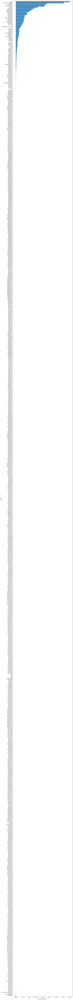

In [7]:
# Logistic Regression
logistic_regression = Model('Logistic Regression', 0.3)
logistic_regression.show_result()




/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Train accuracy :  1.0
Test accuracy :  0.9430011632415665
Predict accuracy :  0.7848699763593381
Best parameters :  {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}


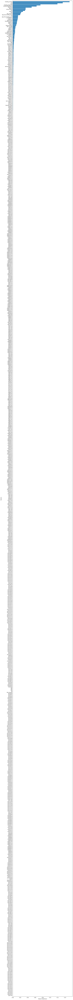

In [8]:
# Decision Tree
decision_tree = Model('Decision Tree', 0.3)
decision_tree.show_result()

Train accuracy :  0.9579524680073126
Test accuracy :  0.9519193485847227
Predict accuracy :  0.6879432624113475
Best parameters :  {'learning_rate': 0.1, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}


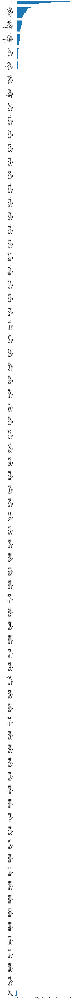

In [9]:
# Gradient Boosting Classifier
gradient_boosting_classifier = Model('Gradient Boosting Classifier', 0.3)
gradient_boosting_classifier.show_result()

In [10]:
# Ada Boost Classifier
ada_boost_classifier = Model('Ada Boost Classifier', 0.3)
ada_boost_classifier.show_result()

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Train accuracy :  0.9664284527173009
Test accuracy :  0.9581233036060488
Predict accuracy :  0.7092198581560284
Best parameters :  {'learning_rate': 1.0, 'n_estimators': 200}


KeyboardInterrupt: 

Train accuracy :  0.5275054013628054
Test accuracy :  0.5327646374563785
Predict accuracy :  0.3546099290780142
Best parameters :  {'var_smoothing': 1e-05}


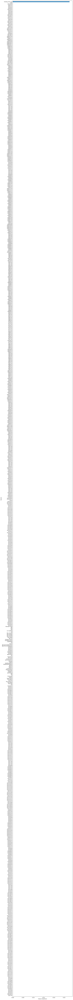

In [ ]:
# GuassianNB
Gaussian_NB = Model("Gaussia NB", 0.3)
Gaussian_NB.show_result()

In [ ]:
# RandomForestClassifier
Ra = Model("Random Forest Classifier", 0.3)
Ra.show_result()

Train accuracy :  0.9991690211068639
Test accuracy :  0.9616130283055447
Predict accuracy :  0.7872340425531915
Best parameters :  {'bootstrap': False, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 300}


KeyboardInterrupt: 